In [1]:
%matplotlib inline

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import cross_val_score, RepeatedKFold, GridSearchCV, RandomizedSearchCV
from sklearn.multioutput import MultiOutputRegressor
from sklearn.svm import LinearSVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
import xgboost as xgb
from sklearn.metrics import mean_squared_error, r2_score, explained_variance_score, mean_absolute_error

from scipy.stats import ttest_1samp, uniform, randint, ttest_ind
from scipy import stats
from statsmodels.stats import weightstats as stests

from functools import wraps
import time

import os
import pickle

In [3]:
plt.style.use('seaborn')

In [4]:
%run CoreFunction.ipynb

In [5]:
TEST_SIZE=0.15
n_comp = 0.95

In [6]:
scaler_min_max = MinMaxScaler()
scaler_z_score = StandardScaler()

# Electricity Load Forecast

# Ensemble Models

Ансамбловите методи са техника за машинно обучение, която комбинира няколко базови модела(обикновено по-слаби), за да произведе един оптимален, по-силен прогнозен модел. Трите са основните стандартни стратегии за обучение в ансамбъл за обучение в ансамбъл - bagging (пакетиране) , stacking (подреждане) и boosting (подсилване). 

- Bootstrap aggregation или накратко __bagging__ е метод за обучение в ансамбъл, който търси разнообразна група от членове на ансамбъла чрез промяна на данните за обучение. Това обикновено включва използване на един алгоритъм за машинно обучение, почти винаги необработено дърво на решенията и обучение на всеки модел на различна извадка от същия набор от данни за обучение. Прогнозите, направени от членовете на ансамбъла, след това се комбинират с помощта на проста статистика, като гласуване или осредняване. 
- Stacked Generalization или накратко __stacking__ е метод на ансамбъл, който работи по следния начин. Ползва един непроменен набор от данни за обучение и различни алгоритми наложени върху тези данни. После се прави модел който се обучава  как най-добре да комбинира прогнозите от различните алгоритми.

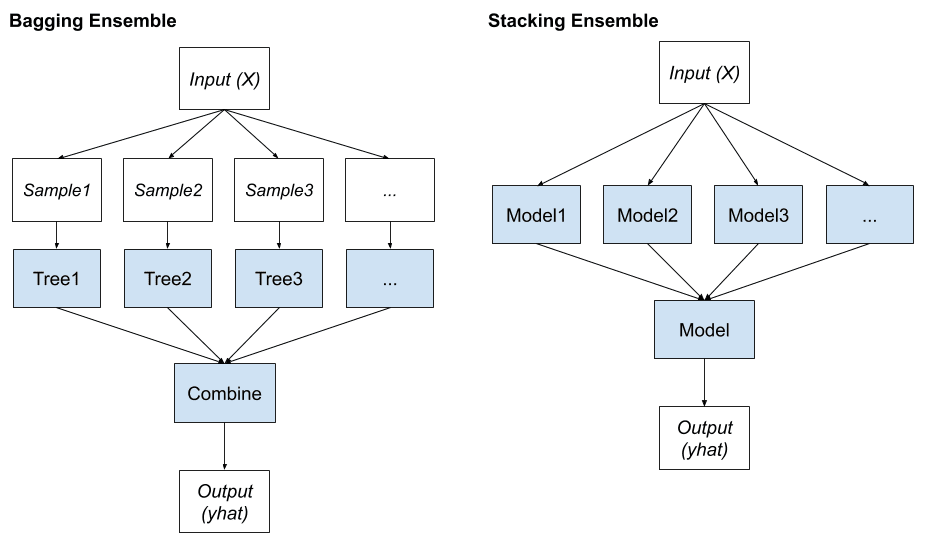

- При __boosting__ ключова е идеята за коригиране на грешки при прогнозирането. Моделите се напасват и се добавят към ансамбъла последователно, така че вторият модел се опитва да коригира прогнозите на първия модел, третият коригира втория модел и т.н. 

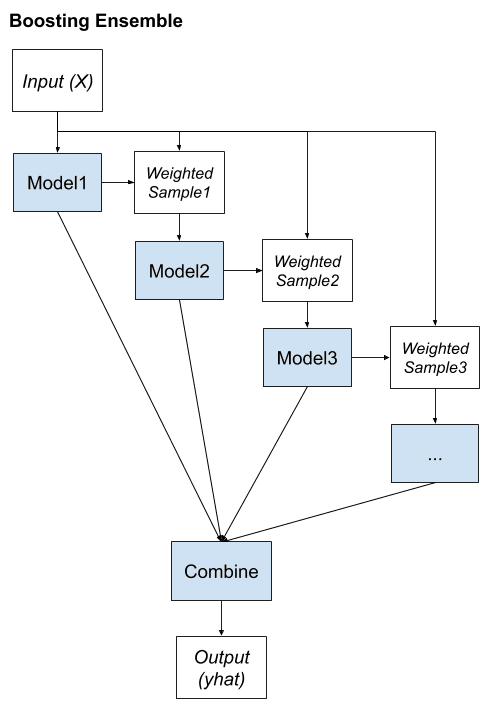

### Read Load Dataset and Normalize Data

In [7]:
load_target, load_attribute, df_data_load = read_data("total load actual",  r"data\df_data_load_ts720_120_24.csv")

In [8]:
load_atribute_train, load_atribute_test, load_target_train, load_target_test, load_attribute_col_names = scaled_data(load_target, load_attribute, TEST_SIZE, scaler_z_score)

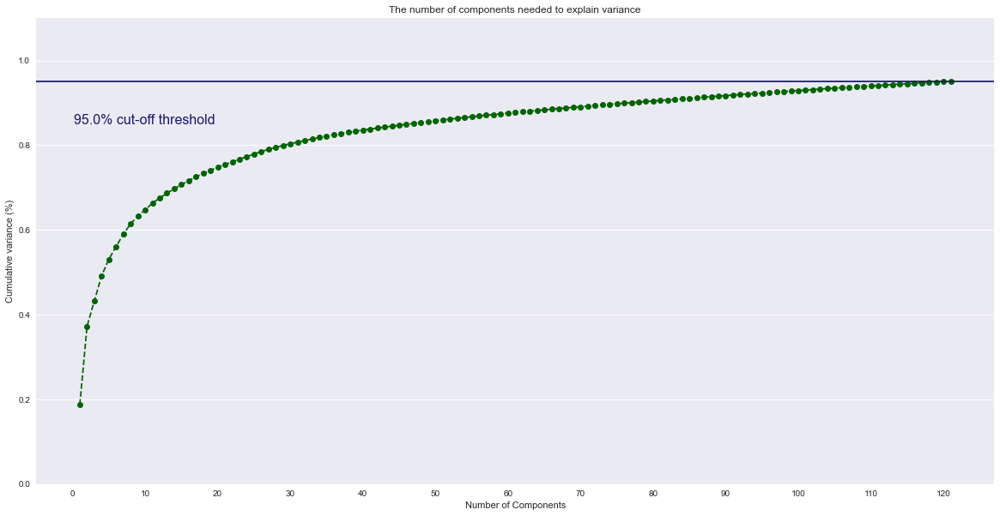

Transformed train shape: (29071, 121)
Transformed test shape: (5131, 121)
Function took 2.9826 seconds


In [9]:
most_important_features, PC_train, PC_test = PCA_feature_preprocessing(load_atribute_train, load_atribute_test, n_comp = n_comp, col_names = load_attribute.columns)

# Bagging Techniques

### Multi-Output Random Forest Regression

Ще опитаме първо да подобрим резултатите на базовите модели чрез популярната __bagging__ техника Random Forest Regression.
Основната идея на Random Forest е да се проведе ансамблово обучение на множество независими Decission Trees, обучени върху едни и същи данни. Осреднявайки резултатите, очакваме да получим по-добър резултат разчитайки, че грешките на всеки модел са независими и различни. Базиран на дървета, този алгоритъм също има склонност към overfitting, което всички тествани по-долу модели показаха.

In [10]:
RFR =RandomForestRegressor(random_state=42, bootstrap = True, warm_start = True, oob_score = True)
tuned_params = {
    "n_estimators": [30, 40, 50],
    "max_features": ["sqrt"],
    "max_depth": [10, 15, 20],
    "max_leaf_nodes":[600, 800, 1000]
}
cv = 3
load_random_forest_regression = get_grid_search(RFR, tuned_params, cv, load_atribute_train, load_target_train)

RandomForestRegressor(max_depth=20, max_features='sqrt', max_leaf_nodes=1000,
                      n_estimators=50, oob_score=True, random_state=42,
                      warm_start=True)
Function took 1898.3993 seconds


In [11]:
save_model(load_random_forest_regression, "data\#load_random_forest_regression.sav")

In [13]:
load_random_forest_regression = load_model("#load_random_forest_regression.sav")
load_random_forest_regression = load_random_forest_regression.best_estimator_

In [14]:
_, _, _ = evaluation_report(load_random_forest_regression, load_atribute_train, load_target_train)

Score Results:
Mean squared error: 5470959.17
Root mean squared error: 2338.41
Mean absolute error: 1773.28
Coefficient of determination: 0.7361
Predicted mean: 28669.388 (3364.003)


In [15]:
_, _, _ = evaluation_report(load_random_forest_regression, load_atribute_test, load_target_test)

Score Results:
Mean squared error: 6946411.94
Root mean squared error: 2635.47
Mean absolute error: 1991.16
Coefficient of determination: 0.6647
Predicted mean: 28661.574 (3280.280)


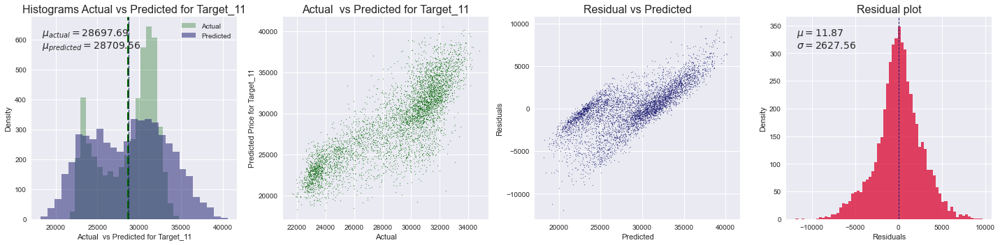

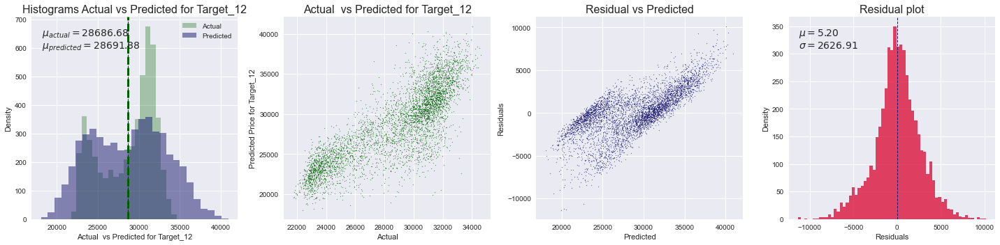

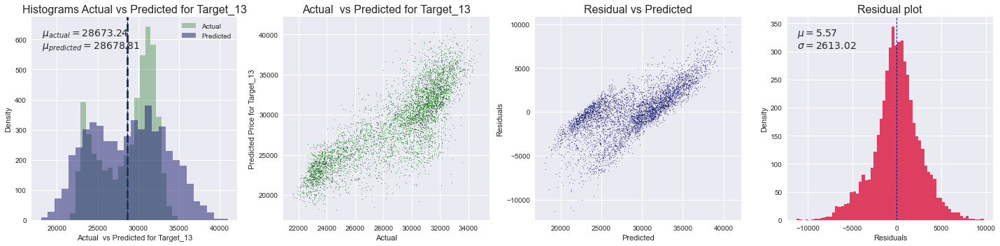

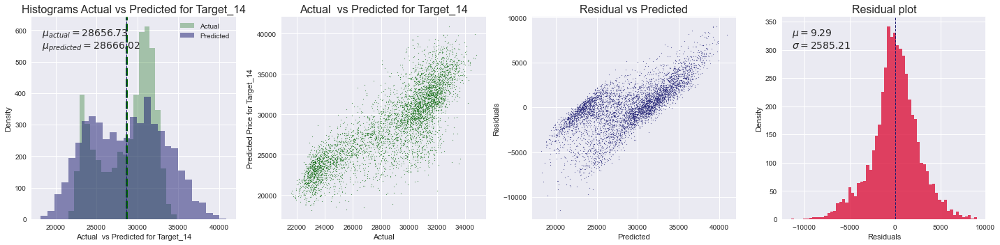

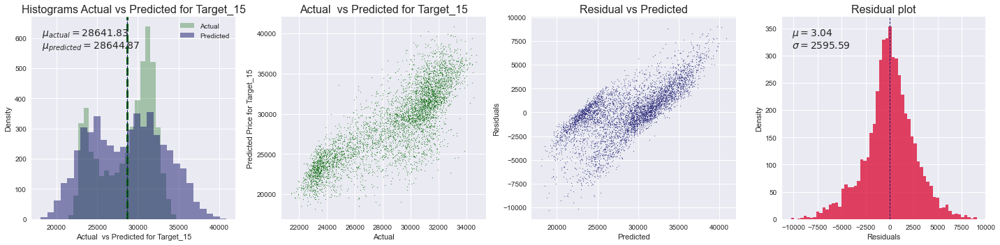

In [16]:
load_prediction = load_random_forest_regression.predict(load_atribute_test)
e_minus_o = get_and_plot_data(load_prediction, load_target_test, start_index=10, stop_index=15)

In [17]:
print(get_ttest (load_prediction, load_target_test, idx=10))

p-value: 0.7462579071444255
we are accepting null hypothesis


In [18]:
print(get_ztest (load_prediction, load_target_test, idx=10))

p-value: 0.746244716549274
accept null hypothesis


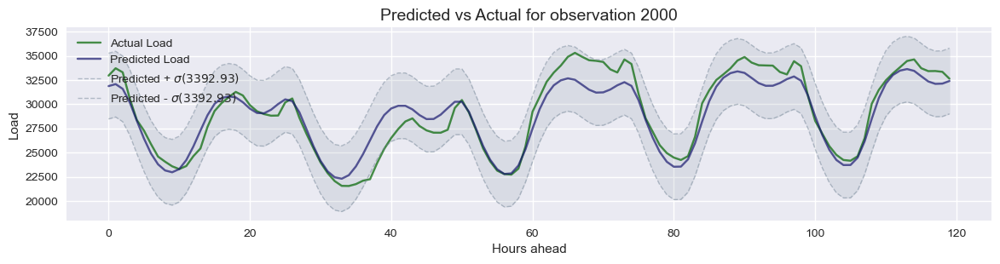

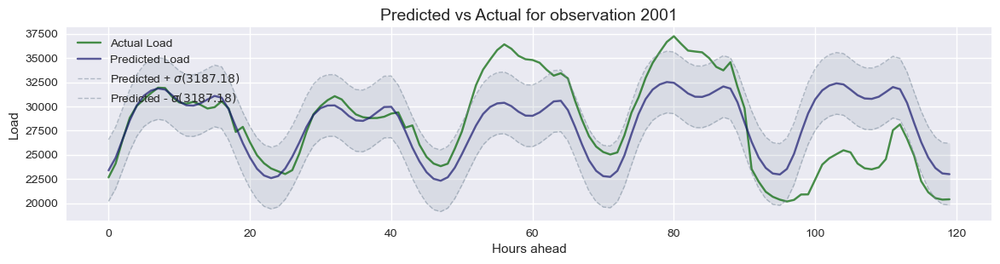

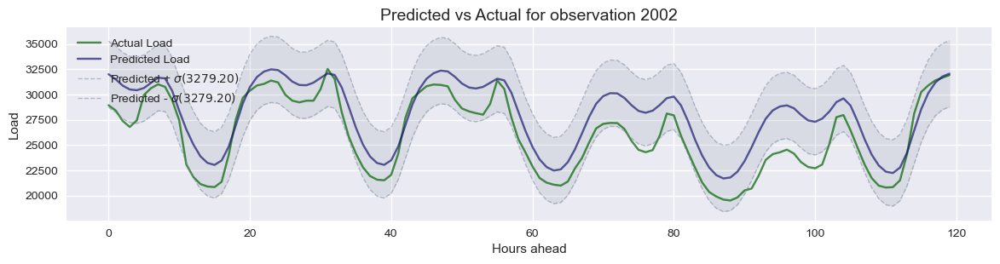

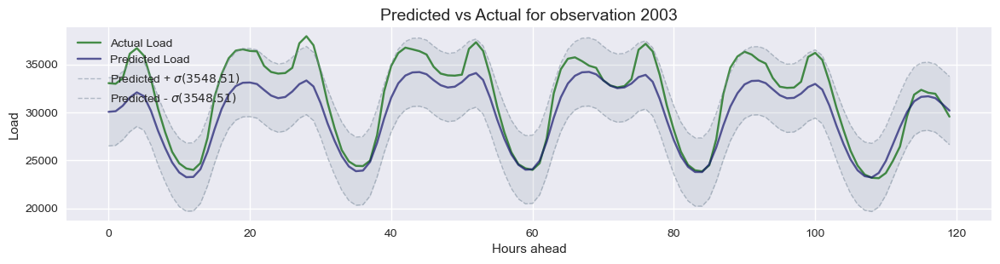

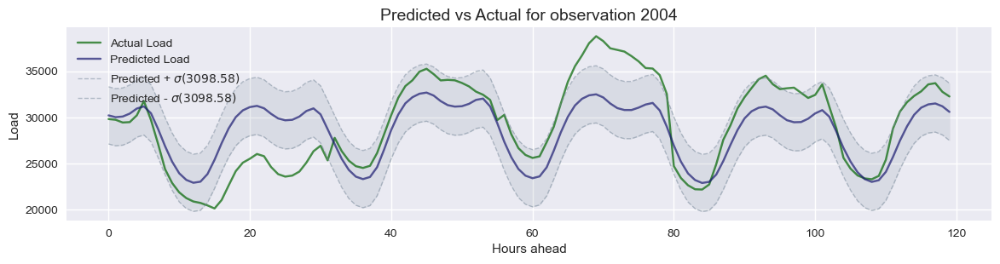

In [19]:
plot_actual_vs_prediction(load_prediction, load_target_test, variable_name = 'Load', start_inx = 2000, end_inx = 2005)

In [23]:
load_random_forest_regression_optimal = RandomForestRegressor(n_estimators=40, max_features="sqrt", max_leaf_nodes=600,  max_depth=15, random_state=42).fit(load_atribute_train, load_target_train)

In [24]:
save_model(load_random_forest_regression_optimal, "#data\load_random_forest_regression_optimal.sav")

In [25]:
load_random_forest_regression_optimal = load_model("#load_random_forest_regression_optimal.sav")

In [26]:
_, _, _ = evaluation_report(load_random_forest_regression_optimal, load_atribute_train, load_target_train)

Score Results:
Mean squared error: 6360862.27
Root mean squared error: 2521.68
Mean absolute error: 1916.73
Coefficient of determination: 0.6932
Predicted mean: 28668.717 (3292.068)


In [27]:
_, _, _ = evaluation_report(load_random_forest_regression_optimal, load_atribute_test, load_target_test)

Score Results:
Mean squared error: 7311949.56
Root mean squared error: 2703.93
Mean absolute error: 2051.47
Coefficient of determination: 0.6470
Predicted mean: 28662.132 (3239.457)


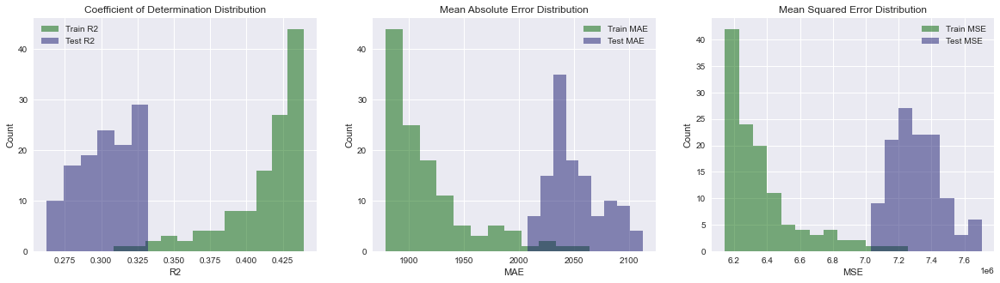

In [28]:
r2_train, r2_test, mae_train, mae_test, mse_train, mse_test = generate_score_distributions(load_random_forest_regression_optimal, load_atribute_train, load_target_train, load_atribute_test, load_target_test)

In [29]:
pv_r2_ttest = get_ttest_2samples(r2_train, r2_test)
pv_mae_ttest = get_ttest_2samples(mae_train, mae_test)
pv_mse_ttest = get_ttest_2samples(mse_train, mse_test)

p-value: 1.7231685108054888e-97
we are rejecting null hypothesis
p-value: 6.608730730773414e-89
we are rejecting null hypothesis
p-value: 2.810877420314598e-103
we are rejecting null hypothesis


In [30]:
pv_r2_ztest = get_ztest_2samples(r2_train, r2_test)
pv_mae_ztest = get_ztest_2samples(mae_train, mae_test)
pv_mse_ztest = get_ztest_2samples(mse_train, mse_test)

p-value: 9.104435279427768e-279
reject null hypothesis
p-value: 1.4728096116193722e-228
reject null hypothesis
p-value: 0.0
reject null hypothesis


# Boosting Techniques

AdaBoostRegressor е мета-оценител, който приема слаб базов оценител и след това прави допълнителни копия на този базов оценител върху същия набор от данни, но където са теглата на екземплярите са коригирани според грешката на текущата прогноза. В проекта са тествани модели с базов оценител DecisionTreeRegressor, както и LinearSVR. 

###  Multi-Output  AdaBoost with DecisionTreeRegressor

Първоначално тестване за скорост на алгоритъма със случайно подбрани хиперпараметри.

In [10]:
tree_pca = DecisionTreeRegressor(max_depth=10, min_samples_leaf = 100)

@timeit
def ada_dtr(estimator, att, target):
    ada_pca = AdaBoostRegressor(base_estimator = estimator, n_estimators = 10, learning_rate = 0.1)
    ada_wrapped_pca = MultiOutputRegressor(estimator=ada_pca)
    ada_wrapped_pca.fit(att, target)
    return ada_wrapped_pca
ada_wrapped_pca = ada_dtr(tree_pca, PC_train, load_target_train)

Function took 2937.3969 seconds


In [31]:
save_model(ada_wrapped_pca, "#ada_load_wrapped_pca_base.sav")

In [32]:
ada_wrapped_pca = load_model("#ada_load_wrapped_pca_base.sav")

In [33]:
_, _, _ = evaluation_report(ada_wrapped_pca, PC_train, load_target_train)

Score Results:
Mean squared error: 5576615.64
Root mean squared error: 2361.27
Mean absolute error: 1786.87
Coefficient of determination: 0.7310
Predicted mean: 28670.958 (3614.527)


In [34]:
_, _, _ = evaluation_report(ada_wrapped_pca, PC_test, load_target_test)

Score Results:
Mean squared error: 6476481.70
Root mean squared error: 2544.36
Mean absolute error: 1923.10
Coefficient of determination: 0.6874
Predicted mean: 28669.373 (3586.672)


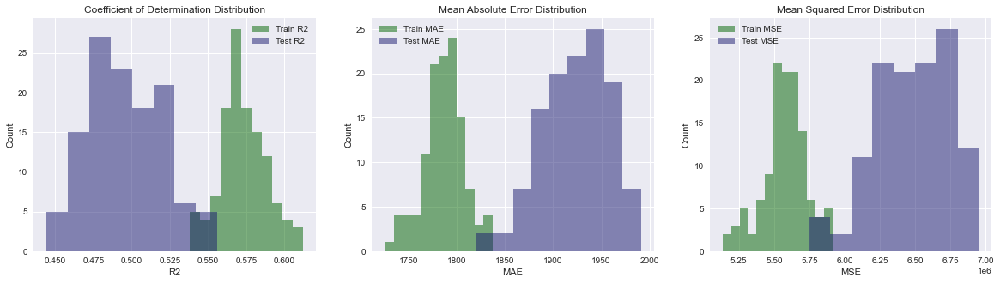

In [35]:
r2_train, r2_test, mae_train, mae_test, mse_train, mse_test = generate_score_distributions(ada_wrapped_pca, PC_train, load_target_train, PC_test, load_target_test)

In [36]:
pv_r2_ttest = get_ttest_2samples(r2_train, r2_test)
pv_mae_ttest = get_ttest_2samples(mae_train, mae_test)
pv_mse_ttest = get_ttest_2samples(mse_train, mse_test)

p-value: 1.9931792739380017e-80
we are rejecting null hypothesis
p-value: 1.4188660362642629e-99
we are rejecting null hypothesis
p-value: 5.060590184393481e-89
we are rejecting null hypothesis


In [37]:
pv_r2_ztest = get_ztest_2samples(r2_train, r2_test)
pv_mae_ztest = get_ztest_2samples(mae_train, mae_test)
pv_mse_ztest = get_ztest_2samples(mse_train, mse_test)

p-value: 1.6765186711908747e-186
reject null hypothesis
p-value: 2.865832647908521e-292
reject null hypothesis
p-value: 3.500422948222149e-229
reject null hypothesis


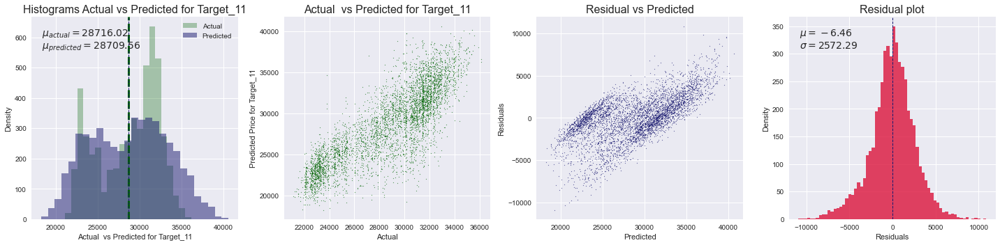

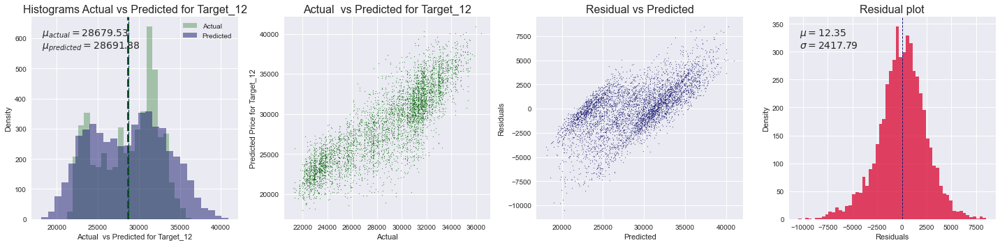

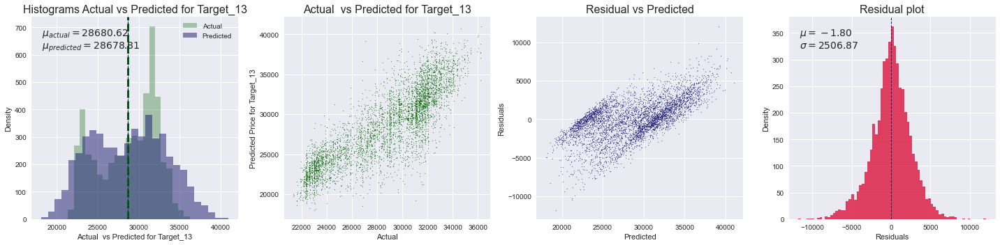

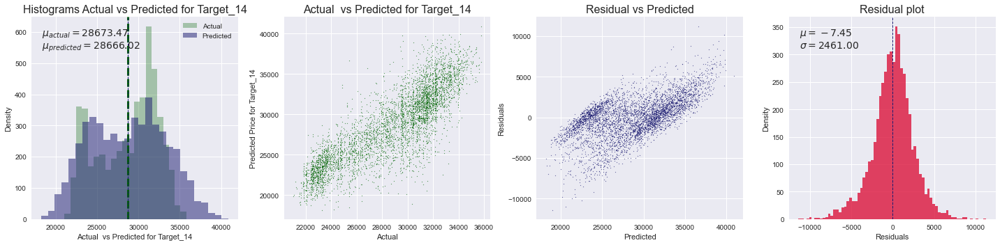

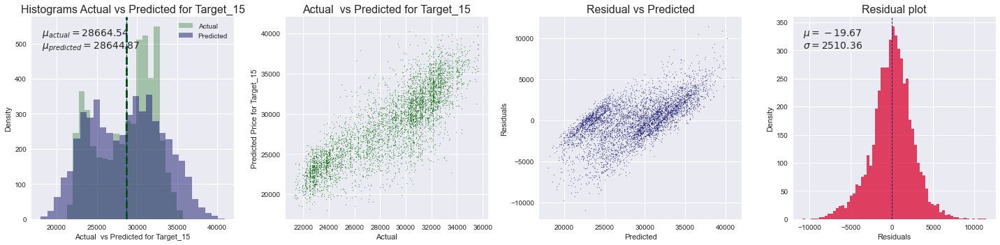

In [38]:
load_prediction_pca = ada_wrapped_pca.predict(PC_test)
e_minus_o = get_and_plot_data(load_prediction_pca, load_target_test, start_index=10, stop_index=15)

In [39]:
print(get_ttest (load_prediction_pca, load_target_test, idx=10))

p-value: 0.8572040506099479
we are accepting null hypothesis


In [40]:
print(get_ztest (load_prediction_pca, load_target_test, idx=10))

p-value: 0.857196943447145
accept null hypothesis


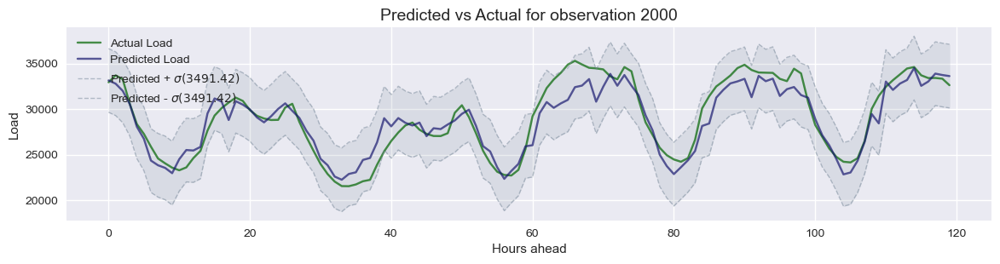

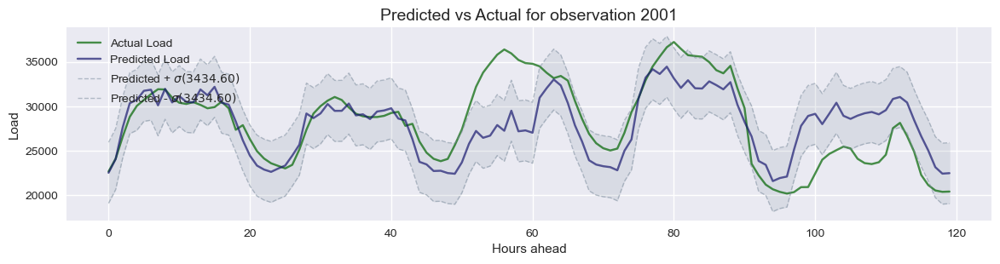

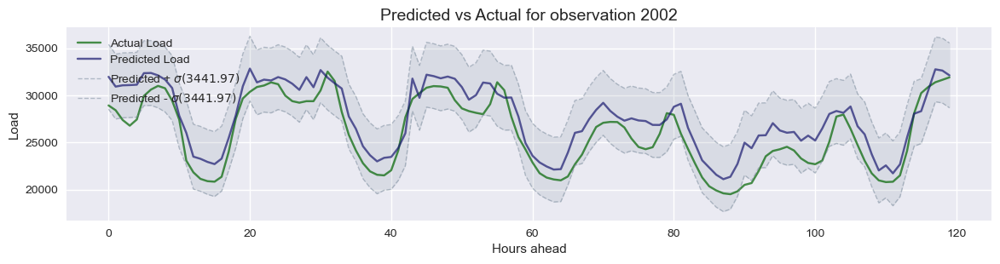

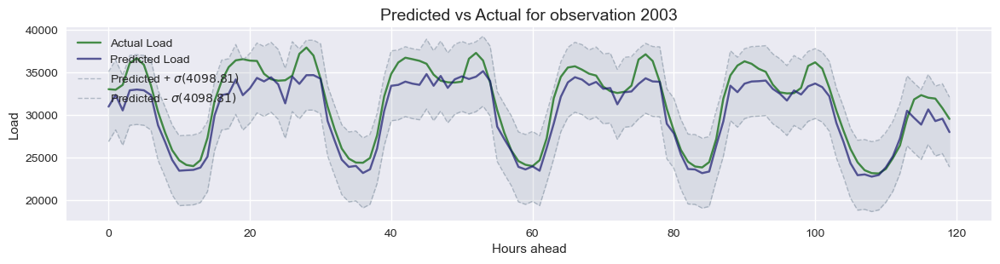

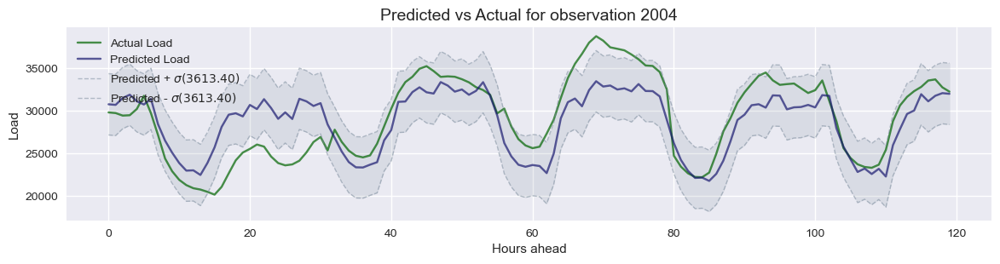

In [41]:
plot_actual_vs_prediction(load_prediction_pca, load_target_test, variable_name = 'Load', start_inx = 2000, end_inx = 2005)

In [37]:
tree_pca = DecisionTreeRegressor()
params = {
    "estimator__learning_rate": [0.01, 1],
    "estimator__n_estimators": [20],
    "estimator__base_estimator__max_depth":[20,  30],
    "estimator__base_estimator__max_features": ["sqrt"],
    "estimator__base_estimator__min_samples_leaf": [200, 400]  
}

ada_pca = AdaBoostRegressor(base_estimator = tree_pca)
ada_wrapped_pca = MultiOutputRegressor(estimator=ada_pca)

adaboost_pca = get_grid_search(ada_wrapped_pca,  params, 3, PC_train, load_target_train )

MultiOutputRegressor(estimator=AdaBoostRegressor(base_estimator=DecisionTreeRegressor(max_depth=20,
                                                                                      max_features='sqrt',
                                                                                      min_samples_leaf=200),
                                                 learning_rate=1,
                                                 n_estimators=20))
Function took 3564.0035 seconds


In [42]:
save_model(adaboost_pca, "#ada_load_wrapped_pca_gs.sav")

In [43]:
adaboost_pca = load_model("#ada_load_wrapped_pca_gs.sav")
adaboost_pca = adaboost_pca.best_estimator_

In [44]:
_, _, _ = evaluation_report(adaboost_pca, PC_train, load_target_train)

Score Results:
Mean squared error: 7025636.49
Root mean squared error: 2650.24
Mean absolute error: 2162.90
Coefficient of determination: 0.6611
Predicted mean: 28698.812 (2932.649)


In [45]:
_, _, _ = evaluation_report(adaboost_pca, PC_test, load_target_test)

Score Results:
Mean squared error: 7927328.71
Root mean squared error: 2815.06
Mean absolute error: 2261.94
Coefficient of determination: 0.6173
Predicted mean: 28695.037 (2876.231)


In [44]:
pd.DataFrame(adaboost_pca.cv_results_).T
# col -1, 5

,0,1,2,3,4,5,6,7
mean_fit_time,952.9586,888.428301,824.317221,738.526066,904.879117,845.755198,795.987352,733.583294
std_fit_time,1.543506,1.846821,17.064766,4.148831,2.891426,2.411417,4.654291,7.379127
mean_score_time,45.105213,41.301525,37.927638,34.914084,36.2254,34.564552,32.898657,25.126401
std_score_time,0.345003,0.424968,0.442251,3.980022,3.01477,3.541416,4.678708,1.221563
param_estimator__base_estimator__max_depth,20,20,20,20,30,30,30,30
param_estimator__base_estimator__max_features,sqrt,sqrt,sqrt,sqrt,sqrt,sqrt,sqrt,sqrt
param_estimator__base_estimator__min_samples_leaf,200,200,400,400,200,200,400,400
param_estimator__learning_rate,0.01,1,0.01,1,0.01,1,0.01,1
param_estimator__n_estimators,20,20,20,20,20,20,20,20
params,"{'estimator__base_estimator__max_depth': 20, '...","{'estimator__base_estimator__max_depth': 20, '...","{'estimator__base_estimator__max_depth': 20, '...","{'estimator__base_estimator__max_depth': 20, '...","{'estimator__base_estimator__max_depth': 30, '...","{'estimator__base_estimator__max_depth': 30, '...","{'estimator__base_estimator__max_depth': 30, '...","{'estimator__base_estimator__max_depth': 30, '..."


In [26]:
tree_pca = DecisionTreeRegressor()
params = {
    "estimator__learning_rate": [0.01, 1],
    "estimator__n_estimators": [10], 
    "estimator__base_estimator__max_depth":[5, 8],
    "estimator__base_estimator__max_features": ["sqrt"],
    "estimator__base_estimator__min_samples_leaf": [80,120],     
}

ada_pca = AdaBoostRegressor(base_estimator = tree_pca)
ada_wrapped_pca = MultiOutputRegressor(estimator=ada_pca)

adaboost_pca_2 = get_grid_search(ada_wrapped_pca,  params, 3, PC_train, load_target_train )

MultiOutputRegressor(estimator=AdaBoostRegressor(base_estimator=DecisionTreeRegressor(max_depth=8,
                                                                                      max_features='sqrt',
                                                                                      min_samples_leaf=80),
                                                 learning_rate=0.01,
                                                 n_estimators=10))
Function took 2102.8362 seconds


In [31]:
save_model(adaboost_pca_2, "#ada_load_wrapped_pca_gs_2.sav")

In [32]:
_, _, _ = evaluation_report(adaboost_pca_2, PC_train, load_target_train)

Score Results:
Mean squared error: 8561566.44
Root mean squared error: 2925.08
Mean absolute error: 2291.70
Coefficient of determination: 0.5871
Predicted mean: 28667.133 (2763.177)


In [33]:
_, _, _ = evaluation_report(adaboost_pca_2, PC_test, load_target_test)

Score Results:
Mean squared error: 9119057.10
Root mean squared error: 3018.62
Mean absolute error: 2365.70
Coefficient of determination: 0.5598
Predicted mean: 28665.710 (2729.334)


In [35]:
pd.DataFrame(adaboost_pca_2.cv_results_).T
# по лоши от предходния grid search

,0,1,2,3,4,5,6,7
mean_fit_time,429.20224,413.569172,430.074228,412.04244,566.671401,540.838317,545.697385,510.840909
std_fit_time,0.847143,1.304007,3.101595,0.942573,1.103112,3.059484,5.335642,1.093082
mean_score_time,33.179648,25.977604,29.964876,20.835473,23.308564,19.047592,19.76629,16.924641
std_score_time,0.611979,1.020064,4.970899,1.231208,0.913602,0.661105,3.695201,0.090466
param_estimator__base_estimator__max_depth,5,5,5,5,8,8,8,8
param_estimator__base_estimator__max_features,sqrt,sqrt,sqrt,sqrt,sqrt,sqrt,sqrt,sqrt
param_estimator__base_estimator__min_samples_leaf,80,80,120,120,80,80,120,120
param_estimator__learning_rate,0.01,1,0.01,1,0.01,1,0.01,1
param_estimator__n_estimators,10,10,10,10,10,10,10,10
params,"{'estimator__base_estimator__max_depth': 5, 'e...","{'estimator__base_estimator__max_depth': 5, 'e...","{'estimator__base_estimator__max_depth': 5, 'e...","{'estimator__base_estimator__max_depth': 5, 'e...","{'estimator__base_estimator__max_depth': 8, 'e...","{'estimator__base_estimator__max_depth': 8, 'e...","{'estimator__base_estimator__max_depth': 8, 'e...","{'estimator__base_estimator__max_depth': 8, 'e..."


In [45]:
tree_pca = DecisionTreeRegressor(max_depth=5, min_samples_leaf = 50)

@timeit
def ada_dtr(estimator, att, target):
    ada_pca = AdaBoostRegressor(base_estimator = estimator, n_estimators = 30, learning_rate = 1)
    ada_wrapped_pca = MultiOutputRegressor(estimator=ada_pca)
    ada_wrapped_pca.fit(att, target)
    return ada_wrapped_pca
ada_wrapped_pca = ada_dtr(tree_pca, PC_train, load_target_train)

Function took 4903.9404 seconds


In [46]:
save_model(ada_wrapped_pca, "#ada_load_wrapped_pca_3.sav")

In [47]:
_, _, _ = evaluation_report(ada_wrapped_pca, PC_train, load_target_train)

Score Results:
Mean squared error: 7553676.17
Root mean squared error: 2748.31
Mean absolute error: 2191.12
Coefficient of determination: 0.6357
Predicted mean: 28555.840 (3220.992)


In [48]:
_, _, _ = evaluation_report(ada_wrapped_pca, PC_test, load_target_test)

Score Results:
Mean squared error: 7977991.34
Root mean squared error: 2824.34
Mean absolute error: 2231.83
Coefficient of determination: 0.6149
Predicted mean: 28550.694 (3209.866)


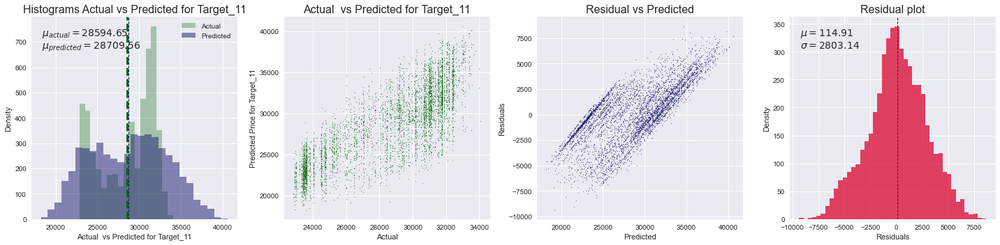

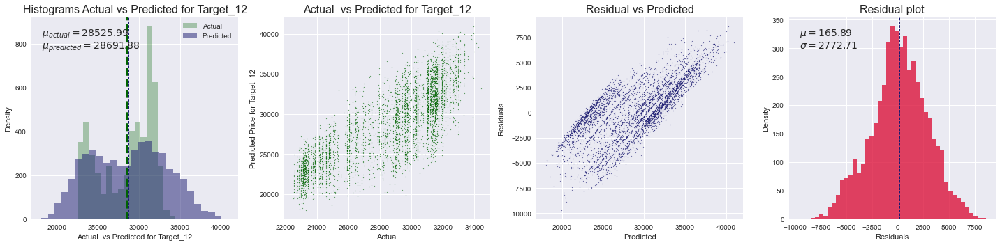

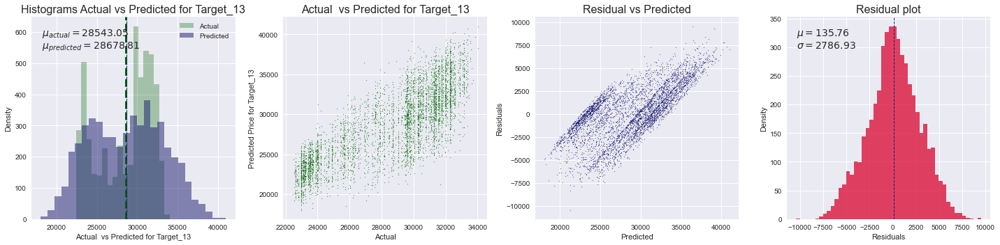

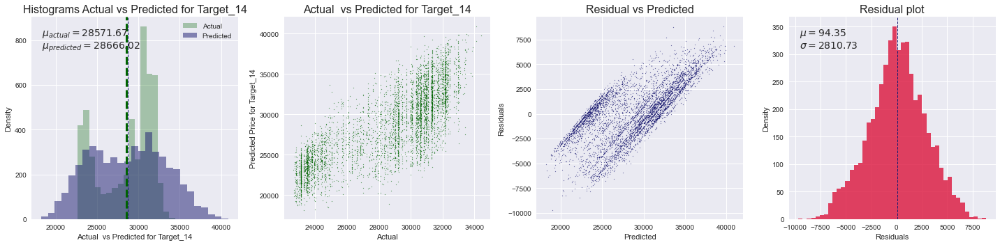

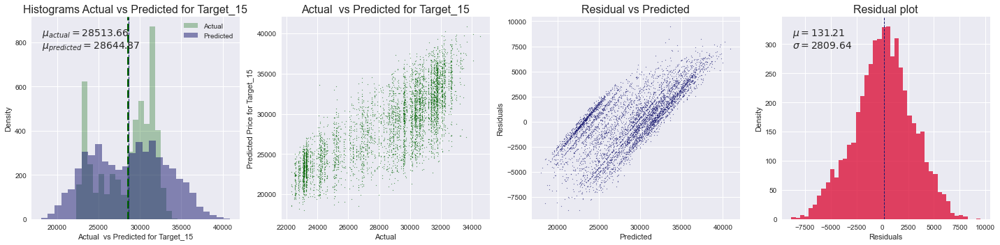

In [49]:
load_prediction_pca = ada_wrapped_pca.predict(PC_test)
e_minus_o = get_and_plot_data(load_prediction_pca, load_target_test, start_index=10, stop_index=15)

In [50]:
print(get_ttest (load_prediction_pca, load_target_test, idx=10))

p-value: 0.0033360519435154342
we are rejecting null hypothesis


In [51]:
print(get_ztest (load_prediction_pca, load_target_test, idx=10))

p-value: 0.003321291913997038
reject null hypothesis


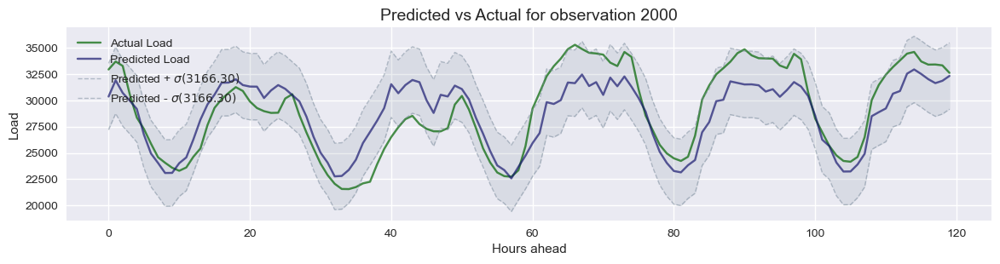

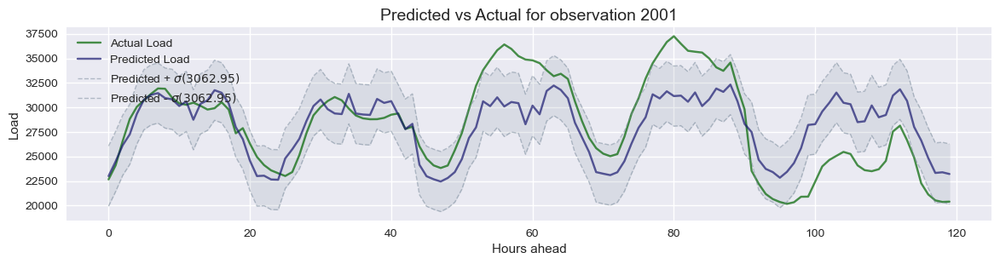

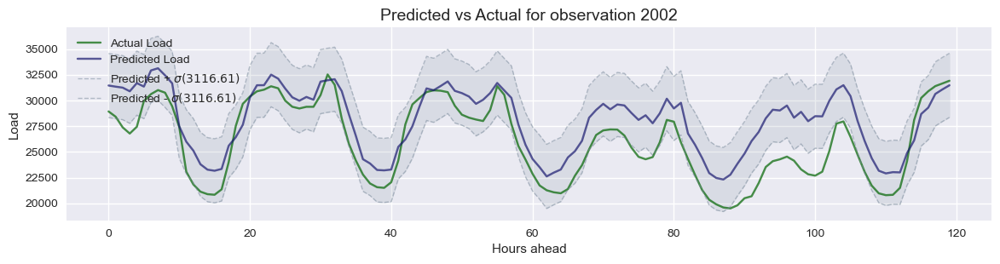

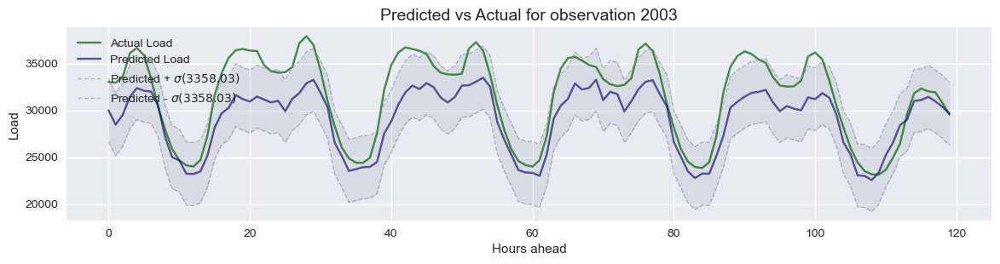

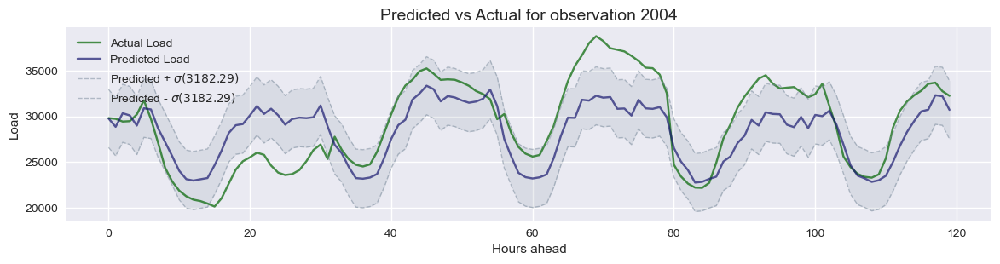

In [52]:
plot_actual_vs_prediction(load_prediction_pca, load_target_test, variable_name = 'Load', start_inx = 2000, end_inx = 2005)

Всички тествани AdaBoost-модели базирани на дървета, не се справят добре със задачата, затова ги отхвърляме от по-нататъшният анализ.

### Multi-Output AdaBoost with LinearSVR

In [11]:
# Тестваме за скорост и после със различни параметри 
svr = LinearSVR(C=10, max_iter = 1000, tol = 0.001, random_state=42,  loss='squared_epsilon_insensitive', dual=False)

@timeit
def ada_svr(estimator, att, target):
    ada_pca = AdaBoostRegressor(base_estimator = estimator, n_estimators = 10, learning_rate = 1)
    ada_wrapped_pca = MultiOutputRegressor(estimator=ada_pca)
    ada_wrapped_pca.fit(att, target)
    return ada_wrapped_pca

ada_wrapped_svr_pca = ada_svr(svr, PC_train, load_target_train)

Function took 617.9707 seconds


In [46]:
save_model(ada_wrapped_svr_pca, "#ada_load_wrapped_svr_pca.sav")

In [47]:
ada_wrapped_svr_pca=load_model("#ada_load_wrapped_svr_pca.sav")

In [48]:
_, _, _ = evaluation_report(ada_wrapped_svr_pca, PC_train, load_target_train)

Score Results:
Mean squared error: 7568800.08
Root mean squared error: 2750.86
Mean absolute error: 2140.92
Coefficient of determination: 0.6349
Predicted mean: 28547.080 (3508.445)


In [49]:
_, _, _ = evaluation_report(ada_wrapped_svr_pca, PC_test, load_target_test)

Score Results:
Mean squared error: 7579790.41
Root mean squared error: 2752.70
Mean absolute error: 2140.93
Coefficient of determination: 0.6341
Predicted mean: 28530.878 (3502.920)


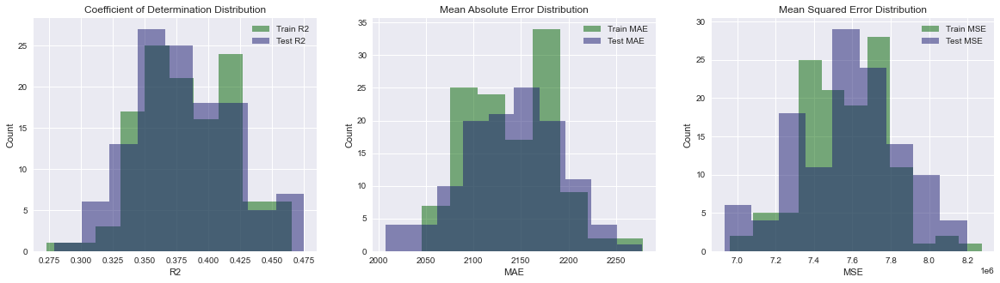

In [50]:
r2_train, r2_test, mae_train, mae_test, mse_train, mse_test = generate_score_distributions(ada_wrapped_svr_pca, PC_train, load_target_train, PC_test, load_target_test)

In [51]:
pv_r2_ttest = get_ttest_2samples(r2_train, r2_test)
pv_mae_ttest = get_ttest_2samples(mae_train, mae_test)
pv_mse_ttest = get_ttest_2samples(mse_train, mse_test)

p-value: 0.5326341468901485
fail to reject the null hypothesis
p-value: 0.9983319316509851
fail to reject the null hypothesis
p-value: 0.7308088495614491
fail to reject the null hypothesis


In [52]:
pv_r2_ztest = get_ztest_2samples(r2_train, r2_test)
pv_mae_ztest = get_ztest_2samples(mae_train, mae_test)
pv_mse_ztest = get_ztest_2samples(mse_train, mse_test)

p-value: 0.5320355013492544
fail to reject the null hypothesis
p-value: 0.9983301785578078
fail to reject the null hypothesis
p-value: 0.7305046823233927
fail to reject the null hypothesis


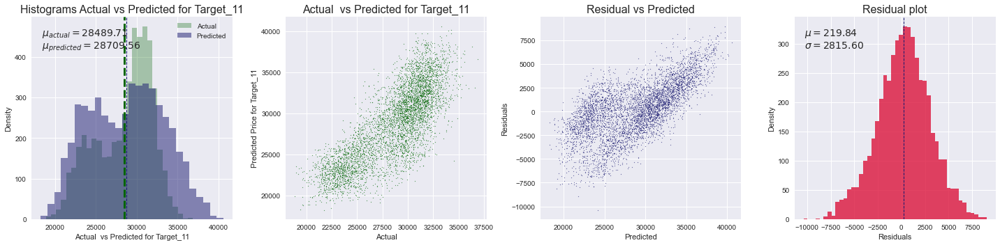

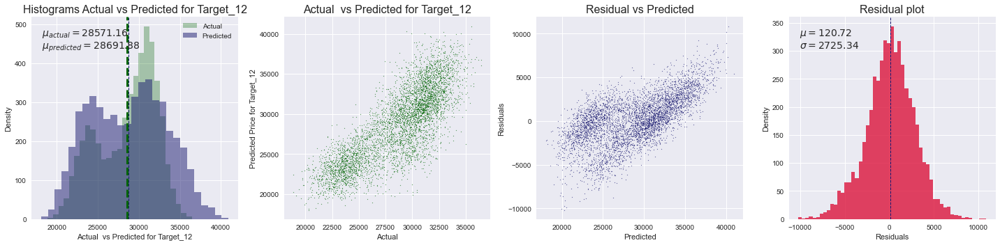

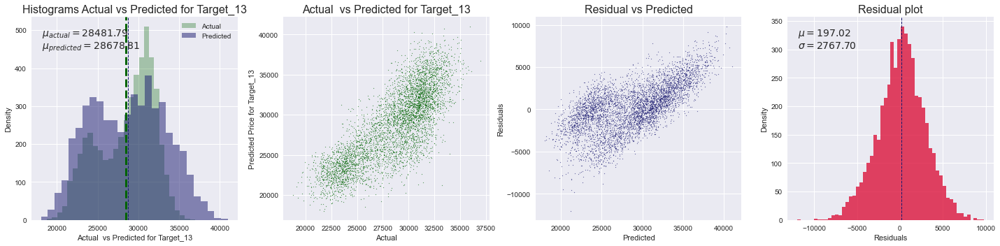

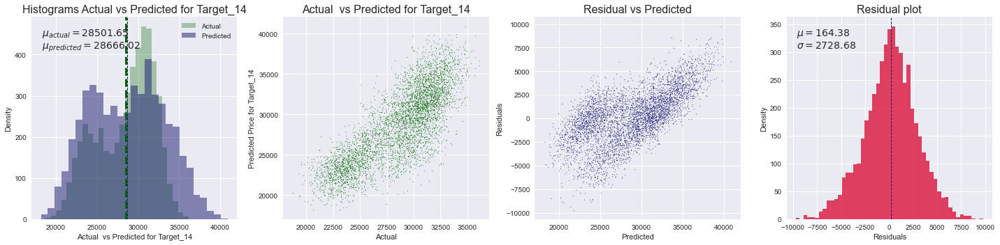

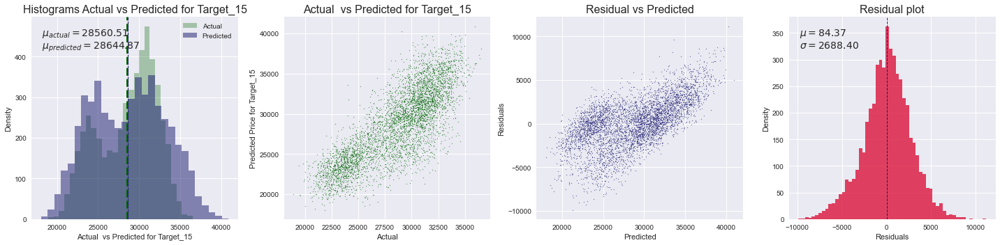

In [53]:
load_prediction_pca = ada_wrapped_svr_pca.predict(PC_test)
e_minus_o = get_and_plot_data(load_prediction_pca, load_target_test, start_index=10, stop_index=15)

In [54]:
print(get_ttest (load_prediction_pca, load_target_test, idx=10))

p-value: 2.3473100423405476e-08
we are rejecting null hypothesis


In [55]:
print(get_ztest (load_prediction_pca, load_target_test, idx=10))

p-value: 2.231724654455092e-08
reject null hypothesis


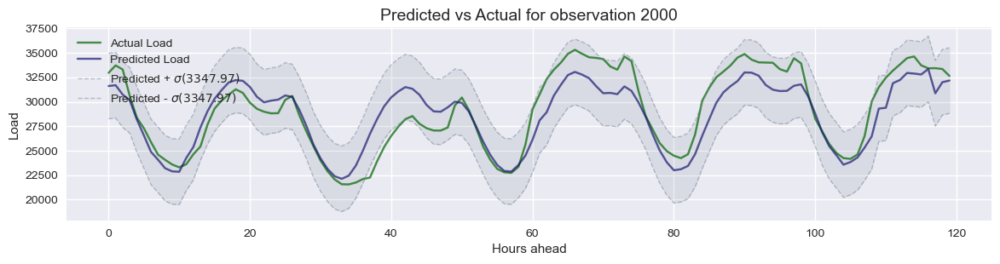

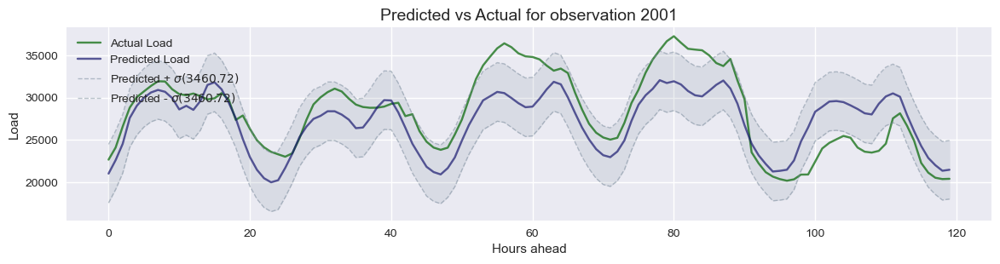

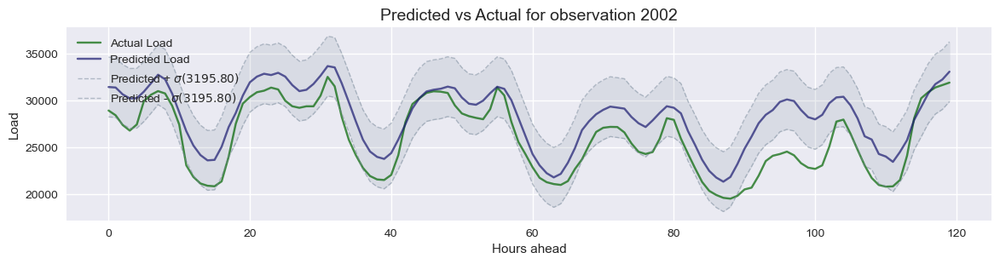

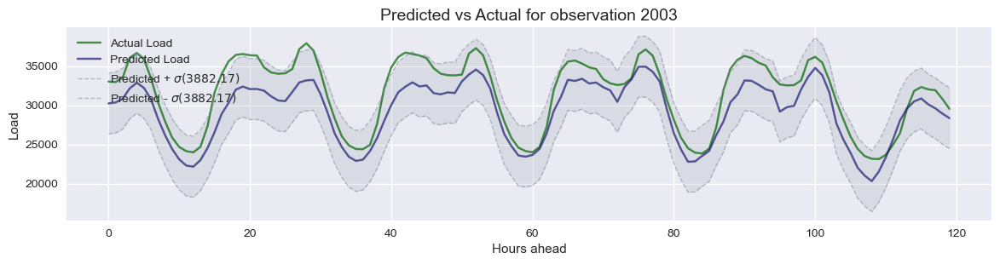

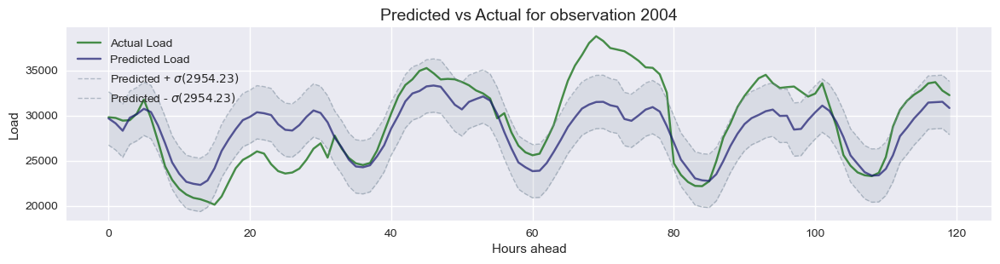

In [56]:
plot_actual_vs_prediction(load_prediction_pca, load_target_test, variable_name = 'Load', start_inx = 2000, end_inx = 2005)
# beteen 0 and 5131 ----> count of observations in test_dataset

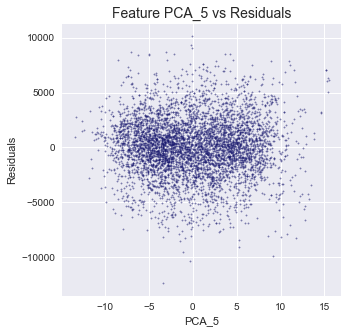

In [57]:
plot_feature_vs_residuals_PCA(PC_test, load_prediction_pca, load_target_test, 
                              start_index=5, stop_index=6, target_indx = 1, col_name = None) 

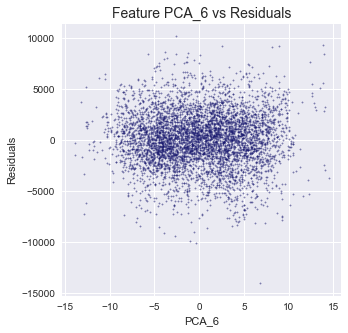

In [58]:
plot_feature_vs_residuals_PCA(PC_test, load_prediction_pca, load_target_test, 
                              start_index=45, stop_index=52, target_indx = 119, col_name = 'PCA_6') 

### Multi-Output Extreme Gradient Boosting (XGBoost)

XGBoost итеративно обучава ансамбъл от плитки дървета, като всяка итерация използва остатъците от грешки на предишния модел, за да пасне на следващия модел. Крайната прогноза е претеглена сума от всички прогнози.

### XGBoost - Test Base Model

In [53]:
# Тестваме за скорост - много бавен и лесно учи наизуст.
@timeit
def xgb_boosting (att, target):
    xgb_test = xgb.XGBRegressor(gamma=0.25,
                                 n_estimators=190,
                                 max_depth=7,
                                 base_score=0.7,
                                 colsample_bytree=0.8,
                                 learning_rate=0.2)
    mo_xgb = MultiOutputRegressor(xgb_test)
    mo_xgb_fitted = mo_xgb.fit(att, target)  
    
    return mo_xgb_fitted

load_xgb = xgb_boosting(PC_train, load_target_train)

Function took 6494.9447 seconds


In [59]:
save_model(load_xgb, "#load_xgb_base_pca.sav")

In [60]:
load_xgb = load_model("#load_xgb_base_pca.sav")

In [61]:
_, _, _ = evaluation_report(load_xgb, PC_train, load_target_train)

Score Results:
Mean squared error: 275027.70
Root mean squared error: 524.02
Mean absolute error: 390.94
Coefficient of determination: 0.9867
Predicted mean: 28672.193 (4420.903)


In [62]:
_, _, _ = evaluation_report(load_xgb, PC_test, load_target_test)

Score Results:
Mean squared error: 1753781.02
Root mean squared error: 1323.96
Mean absolute error: 976.47
Coefficient of determination: 0.9153
Predicted mean: 28677.854 (4132.999)


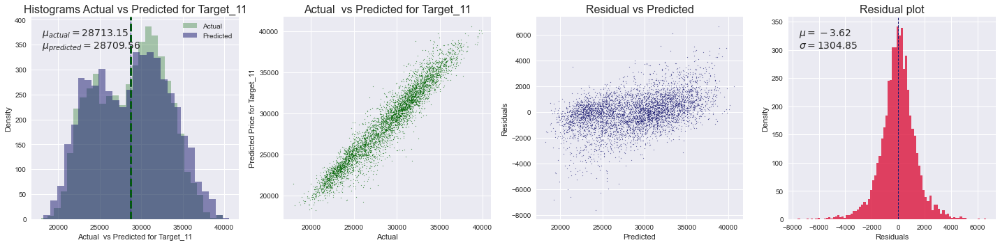

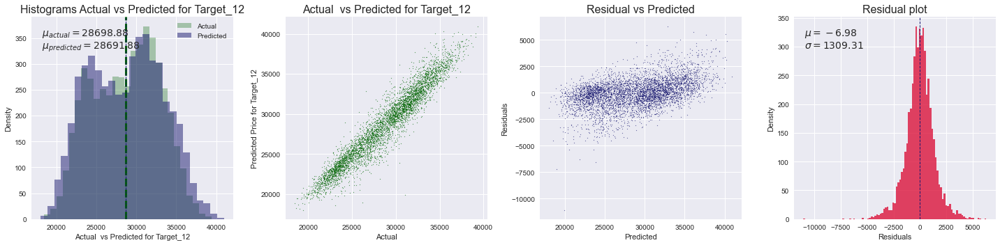

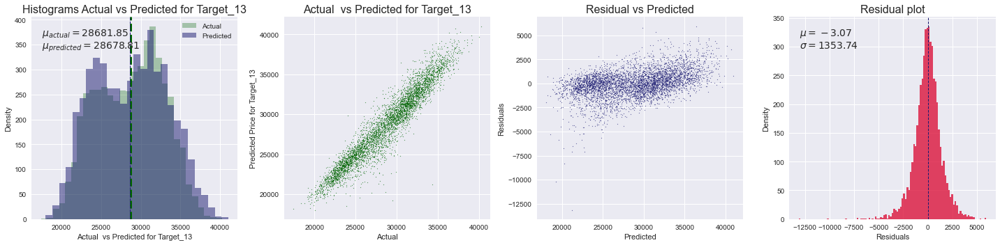

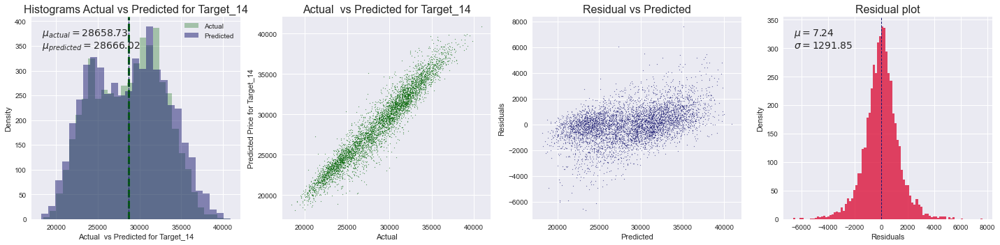

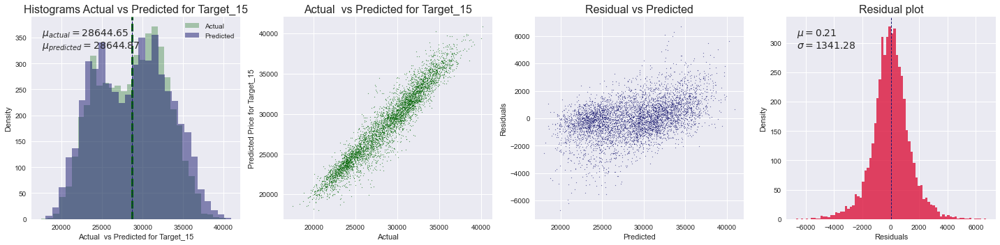

In [63]:
load_prediction_pca = load_xgb.predict(PC_test)
e_minus_o = get_and_plot_data(load_prediction_pca, load_target_test, start_index=10, stop_index=15)

In [64]:
print(get_ttest (load_prediction_pca, load_target_test, idx=15))

p-value: 0.496965906811321
we are accepting null hypothesis


In [65]:
print(get_ztest (load_prediction_pca, load_target_test, idx=15))

p-value: 0.49693525863250954
accept null hypothesis


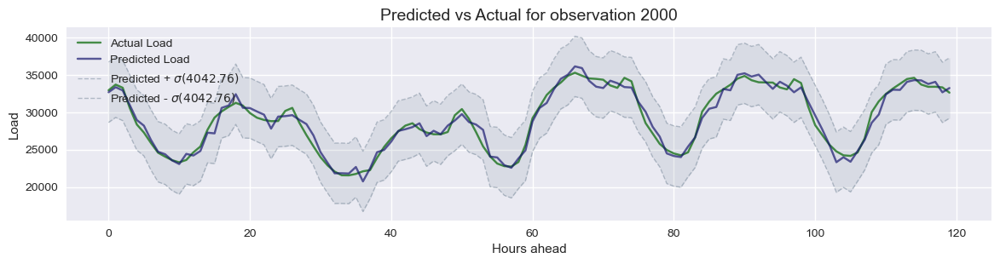

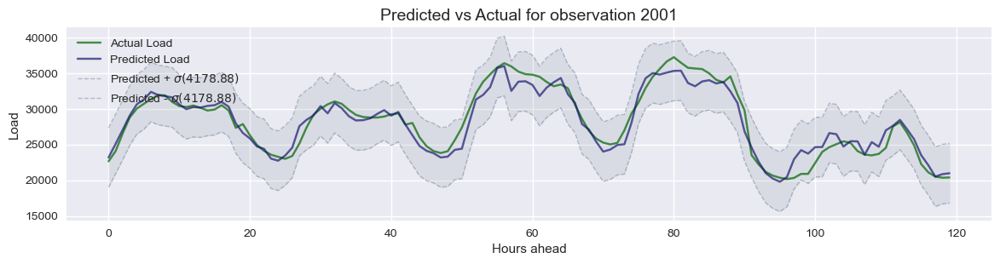

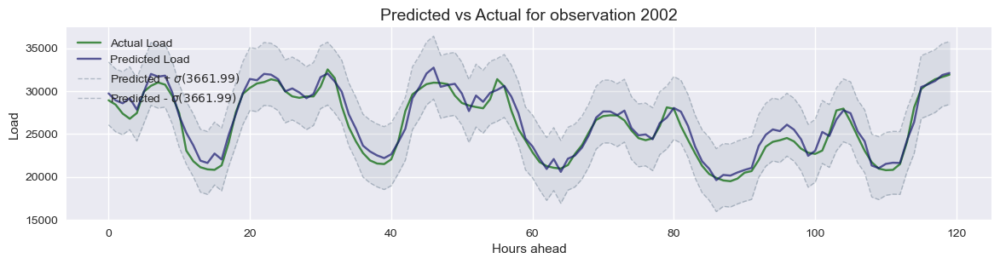

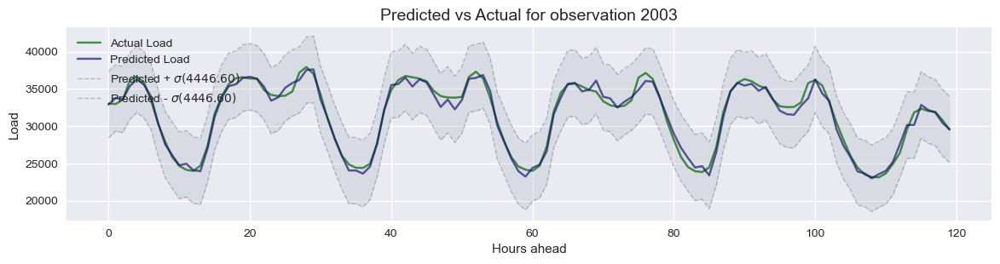

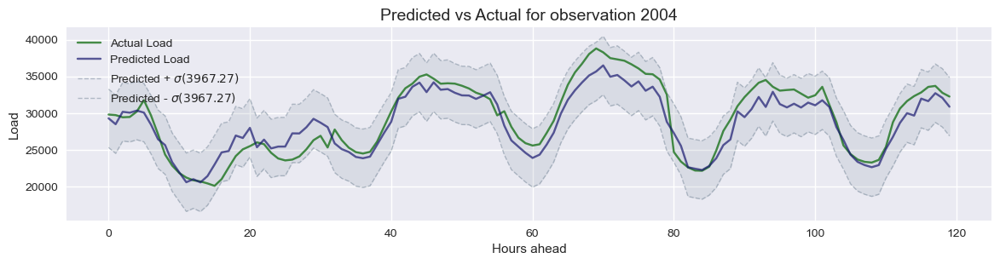

In [66]:
plot_actual_vs_prediction(load_prediction_pca, load_target_test, variable_name = 'Load', start_inx = 2000, end_inx = 2005)

### XGBoost - Optimization

In [67]:
def report_best_scores(results, n_top=3):
    for i in range(1, n_top + 1):
        candidates = np.flatnonzero(results['rank_test_score'] == i)
        for candidate in candidates:
            print("Model with rank: {0}".format(i))
            print("Mean validation score: {0:.3f} (std: {1:.3f})".format(
                  results['mean_test_score'][candidate],
                  results['std_test_score'][candidate]))
            print("Parameters: {0}".format(results['params'][candidate]))
            print("")

In [64]:
xgb_model = MultiOutputRegressor(xgb.XGBRegressor())

params = {
    "estimator__colsample_bytree": uniform(0.7, 0.3),
    "estimator__gamma": uniform(0, 0.5),
    "estimator__learning_rate": uniform(0.03, 0.3), # default 0.1 
    "estimator__max_depth": randint(2, 10), # default 3
    "estimator__n_estimators": randint(100, 200), # default 100
    "estimator__subsample": uniform(0.6, 0.4)
}

load_xgb_pca = make_random_grid(xgb_model, params, 
                                 3, PC_train, load_target_train, 
                                 n_iter=3)

Fitting 3 folds for each of 3 candidates, totalling 9 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   4 out of   9 | elapsed: 172.7min remaining: 215.9min
[Parallel(n_jobs=-1)]: Done   9 out of   9 | elapsed: 204.0min finished


MultiOutputRegressor(estimator=XGBRegressor(base_score=None, booster=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=0.8123620356542087,
                                            enable_categorical=False,
                                            gamma=0.4753571532049581,
                                            gpu_id=None, importance_type=None,
                                            interaction_constraints=None,
                                            learning_rate=0.24959818254342153,
                                            max_delta_step=None, max_depth=6,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            n_estimators=120, n_jobs=None,
                                 

In [68]:
save_model(load_xgb_pca, "#load_xgb_pca_gs.sav")

In [72]:
report_best_scores(load_xgb_pca.cv_results_)

Model with rank: 1
Mean validation score: 0.857 (std: 0.003)
Parameters: {'estimator__colsample_bytree': 0.8123620356542087, 'estimator__gamma': 0.4753571532049581, 'estimator__learning_rate': 0.24959818254342153, 'estimator__max_depth': 6, 'estimator__n_estimators': 120, 'estimator__subsample': 0.6624074561769746}

Model with rank: 2
Mean validation score: 0.843 (std: 0.003)
Parameters: {'estimator__colsample_bytree': 0.7467983561008608, 'estimator__gamma': 0.02904180608409973, 'estimator__learning_rate': 0.28985284373248055, 'estimator__max_depth': 5, 'estimator__n_estimators': 123, 'estimator__subsample': 0.8603553891795411}

Model with rank: 3
Mean validation score: 0.774 (std: 0.002)
Parameters: {'estimator__colsample_bytree': 0.71692347370813, 'estimator__gamma': 0.36099938613341237, 'estimator__learning_rate': 0.31156581270472505, 'estimator__max_depth': 3, 'estimator__n_estimators': 163, 'estimator__subsample': 0.996884623716487}



In [69]:
load_xgb_pca = load_model("#load_xgb_pca_gs.sav")
load_xgb_pca = load_xgb_pca.best_estimator_

In [70]:
_, _, _ = evaluation_report(load_xgb_pca, PC_train, load_target_train)

Score Results:
Mean squared error: 969527.67
Root mean squared error: 984.47
Mean absolute error: 745.82
Coefficient of determination: 0.9532
Predicted mean: 28671.951 (4279.017)


In [71]:
_, _, _ = evaluation_report(load_xgb_pca, PC_test, load_target_test)

Score Results:
Mean squared error: 2452784.25
Root mean squared error: 1565.89
Mean absolute error: 1173.50
Coefficient of determination: 0.8816
Predicted mean: 28678.535 (4095.999)


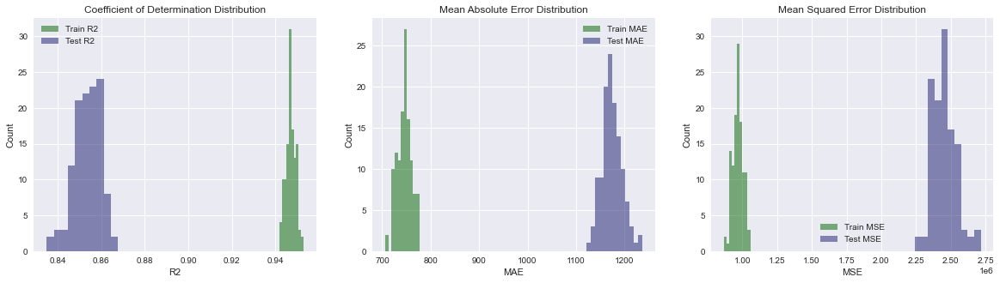

In [72]:
r2_train, r2_test, mae_train, mae_test, mse_train, mse_test = generate_score_distributions(load_xgb_pca, PC_train, load_target_train, PC_test, load_target_test)

In [73]:
pv_r2_ttest = get_ttest_2samples(r2_train, r2_test)
pv_mae_ttest = get_ttest_2samples(mae_train, mae_test)
pv_mse_ttest = get_ttest_2samples(mse_train, mse_test)

p-value: 2.125792296950156e-242
we are rejecting null hypothesis
p-value: 7.708707284360008e-260
we are rejecting null hypothesis
p-value: 3.0424171444504637e-251
we are rejecting null hypothesis


In [74]:
pv_r2_ztest = get_ztest_2samples(r2_train, r2_test)
pv_mae_ztest = get_ztest_2samples(mae_train, mae_test)
pv_mse_ztest = get_ztest_2samples(mse_train, mse_test)

p-value: 0.0
reject null hypothesis
p-value: 0.0
reject null hypothesis
p-value: 0.0
reject null hypothesis


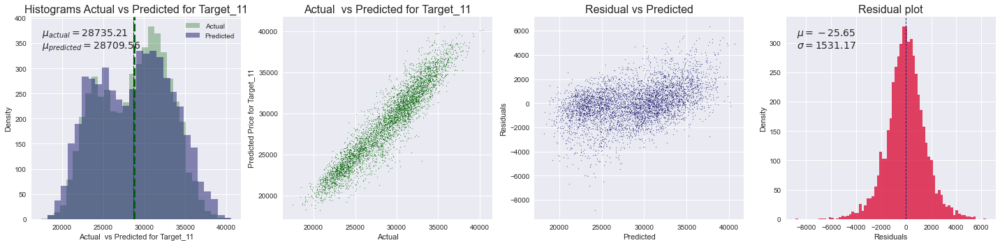

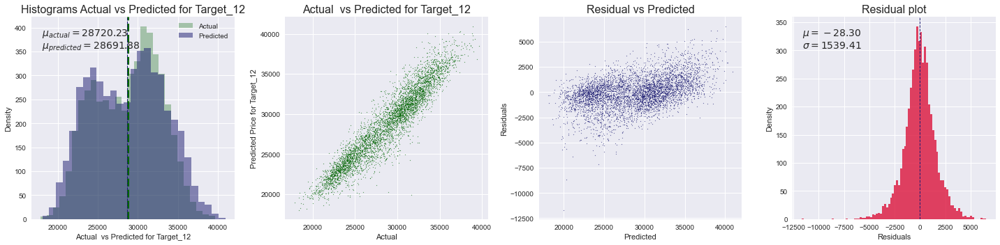

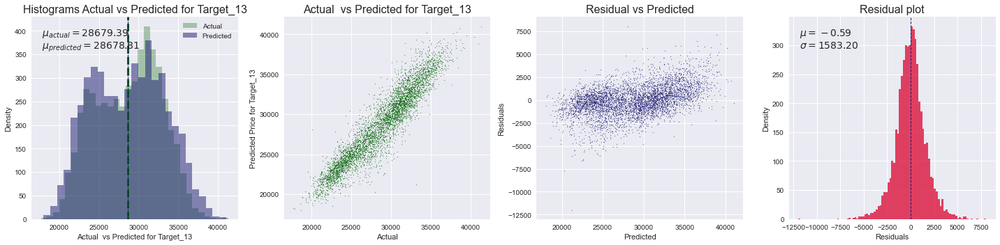

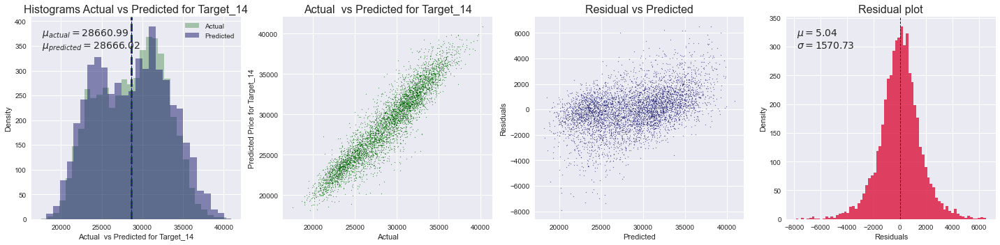

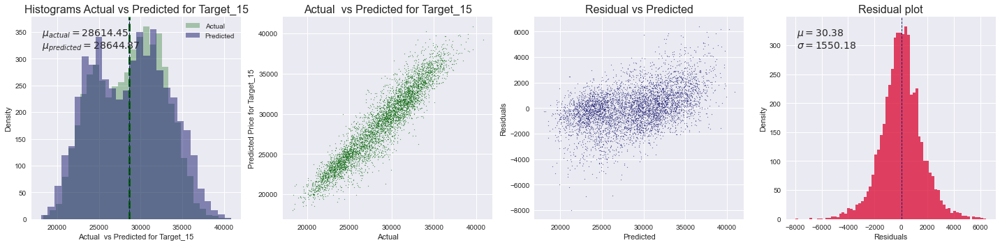

In [75]:
load_prediction_pca = load_xgb_pca.predict(PC_test)
e_minus_o = get_and_plot_data(load_prediction_pca, load_target_test, start_index=10, stop_index=15)

In [76]:
print(get_ttest (load_prediction_pca, load_target_test, idx=10))

p-value: 0.2301830512434754
we are accepting null hypothesis


In [77]:
print(get_ztest (load_prediction_pca, load_target_test, idx=10))

p-value: 0.23012763628091282
accept null hypothesis


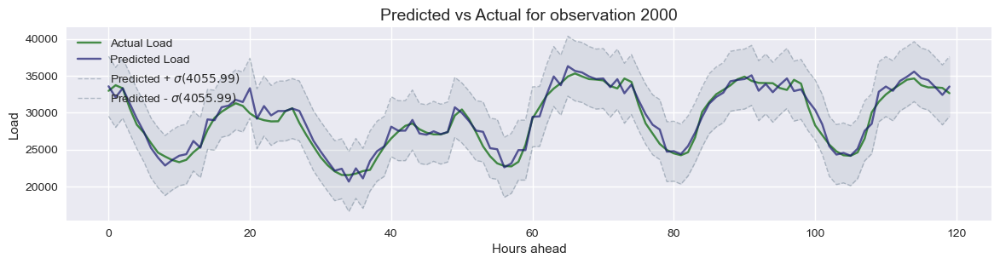

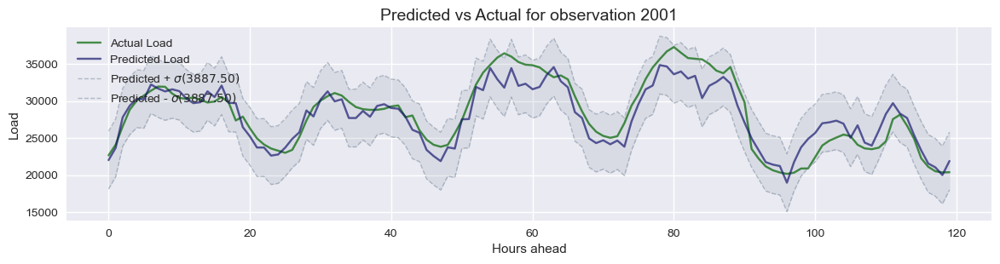

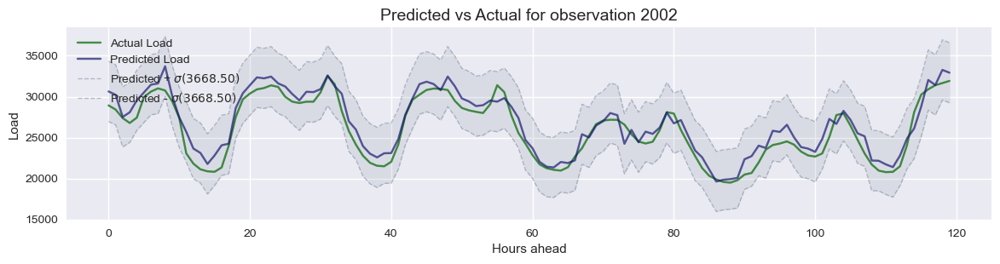

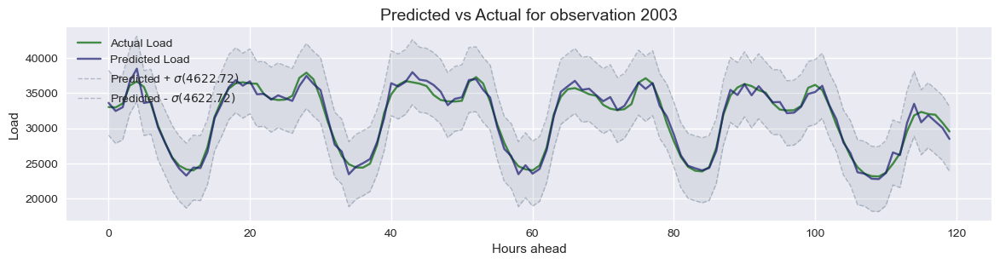

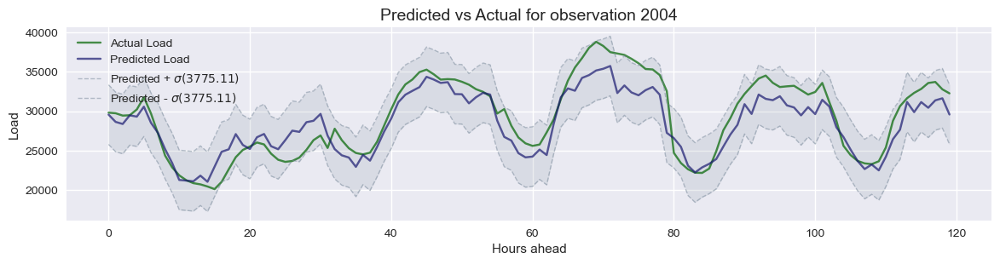

In [78]:
plot_actual_vs_prediction(load_prediction_pca, load_target_test, variable_name = 'Load', start_inx = 2000, end_inx = 2005)

### Some Looks Inside In XGBRegressor

In [79]:
load_xgb_pca = load_model("#load_xgb_pca_gs.sav")
pd.DataFrame(load_xgb_pca.cv_results_).T

,0,1,2
mean_fit_time,12222.01744,10339.818302,6119.218186
std_fit_time,1.135658,4.701823,848.799458
mean_score_time,5.704171,8.593032,6.991536
std_score_time,0.311562,0.702161,0.66589
param_estimator__colsample_bytree,0.812362,0.746798,0.716923
param_estimator__gamma,0.475357,0.029042,0.360999
param_estimator__learning_rate,0.249598,0.289853,0.311566
param_estimator__max_depth,6,5,3
param_estimator__n_estimators,120,123,163
param_estimator__subsample,0.662407,0.860355,0.996885


Model with rank: 1 -----> 0.9532 ---->   0.8816
Mean validation score: 0.857 (std: 0.003)
Parameters: {'estimator__colsample_bytree': 0.8123620356542087, 'estimator__gamma': 0.4753571532049581, 'estimator__learning_rate': 0.24959818254342153, 'estimator__max_depth': 6, 'estimator__n_estimators': 120, 'estimator__subsample': 0.6624074561769746}

Model with rank: 2
Mean validation score: 0.843 (std: 0.003)
Parameters: {'estimator__colsample_bytree': 0.7467983561008608, 'estimator__gamma': 0.02904180608409973, 'estimator__learning_rate': 0.28985284373248055, 'estimator__max_depth': 5, 'estimator__n_estimators': 123, 'estimator__subsample': 0.8603553891795411}

Model with rank: 3
Mean validation score: 0.774 (std: 0.002)
Parameters: {'estimator__colsample_bytree': 0.71692347370813, 'estimator__gamma': 0.36099938613341237, 'estimator__learning_rate': 0.31156581270472505, 'estimator__max_depth': 3, 'estimator__n_estimators': 163, 'estimator__subsample': 0.996884623716487}

In [80]:
pd.DataFrame(load_xgb_pca.cv_results_).T.iloc[:, 0]

mean_fit_time                                                              12222.01744
std_fit_time                                                                  1.135658
mean_score_time                                                               5.704171
std_score_time                                                                0.311562
param_estimator__colsample_bytree                                             0.812362
param_estimator__gamma                                                        0.475357
param_estimator__learning_rate                                                0.249598
param_estimator__max_depth                                                           6
param_estimator__n_estimators                                                      120
param_estimator__subsample                                                    0.662407
params                               {'estimator__colsample_bytree': 0.812362035654...
split0_test_score                          

Parameters: {'estimator__colsample_bytree': 0.7467983561008608, 'estimator__gamma': 0.02904180608409973, 'estimator__learning_rate': 0.28985284373248055, 'estimator__max_depth': 5, 'estimator__n_estimators': 123, 'estimator__subsample': 0.8603553891795411}

Model with rank: 3
Mean validation score: 0.774 (std: 0.002)
Parameters: {'estimator__colsample_bytree': 0.71692347370813, 'estimator__gamma': 0.36099938613341237, 'estimator__learning_rate': 0.31156581270472505, 'estimator__max_depth': 3, 'estimator__n_estimators': 163, 'estimator__subsample': 0.996884623716487}

In [17]:
@timeit
def xgb_boosting (att, target):
    xgb_test = xgb.XGBRegressor(gamma=0.2,
                                n_estimators=140,
                                max_depth=4,
                                base_score=0.7,
                                colsample_bytree=0.73,
                                learning_rate=0.3,
                                subsample = 0.9)
    mo_xgb = MultiOutputRegressor(xgb_test)
    mo_xgb_fitted = mo_xgb.fit(att, target)  
    
    return mo_xgb_fitted

load_xgb_end_test = xgb_boosting(PC_train, load_target_train)

Function took 2204.5928 seconds


In [81]:
save_model(load_xgb_end_test, "#load_xgb_end_test.sav")

In [82]:
load_xgb_end_test = load_model("#load_xgb_end_test.sav")

In [83]:
_, _, _ = evaluation_report(load_xgb_end_test, PC_train, load_target_train)

Score Results:
Mean squared error: 2445493.28
Root mean squared error: 1563.65
Mean absolute error: 1179.04
Coefficient of determination: 0.8820
Predicted mean: 28672.357 (4046.481)


In [84]:
_, _, _ = evaluation_report(load_xgb_end_test, PC_test, load_target_test)

Score Results:
Mean squared error: 3574038.14
Root mean squared error: 1890.25
Mean absolute error: 1422.71
Coefficient of determination: 0.8275
Predicted mean: 28674.760 (3954.498)


In [32]:
@timeit
def xgb_boosting (att, target):
    xgb_test = xgb.XGBRegressor(gamma=0.2,
                                n_estimators=250,
                                max_depth=4,
                                base_score=0.7,
                                colsample_bytree=0.73,
                                learning_rate=0.2,
                                subsample = 0.9)
    mo_xgb = MultiOutputRegressor(xgb_test)
    mo_xgb_fitted = mo_xgb.fit(att, target)  
    
    return mo_xgb_fitted

load_xgb_end_test_1 = xgb_boosting(PC_train, load_target_train)

Function took 4034.0021 seconds


In [85]:
save_model(load_xgb_end_test_1, "#load_xgb_end_test_1.sav")

In [34]:
_, _, _ = evaluation_report(load_xgb_end_test_1, PC_train, load_target_train)

Score Results:
Mean squared error: 2021099.41
Root mean squared error: 1421.53
Mean absolute error: 1067.40
Coefficient of determination: 0.9025
Predicted mean: 28671.939 (4067.457)


In [35]:
_, _, _ = evaluation_report(load_xgb_end_test_1, PC_test, load_target_test)

Score Results:
Mean squared error: 3160435.38
Root mean squared error: 1777.56
Mean absolute error: 1332.45
Coefficient of determination: 0.8474
Predicted mean: 28676.371 (3956.528)


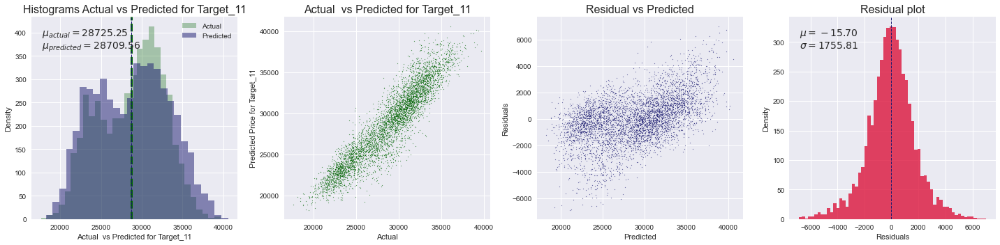

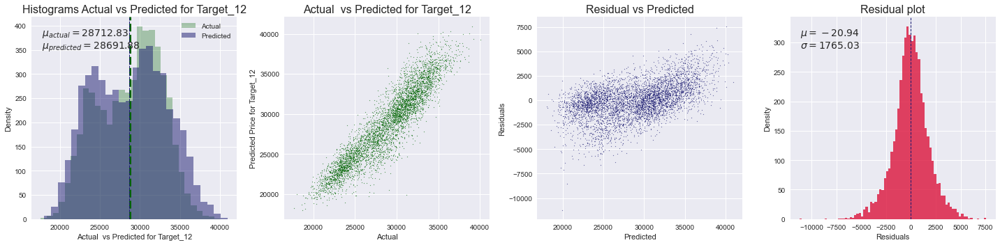

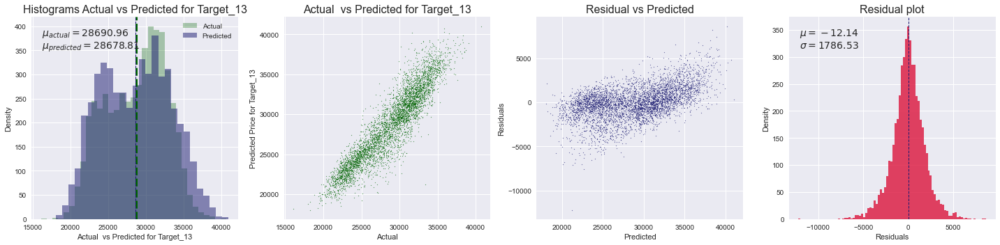

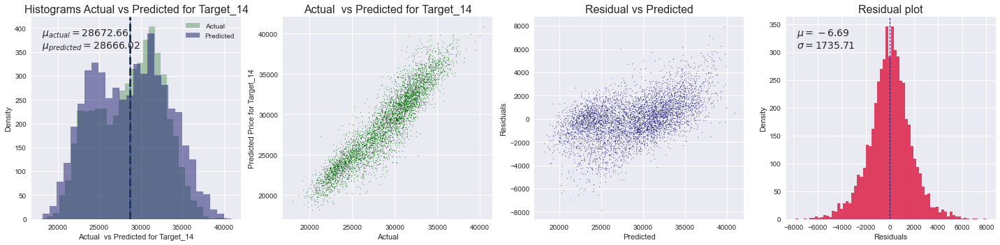

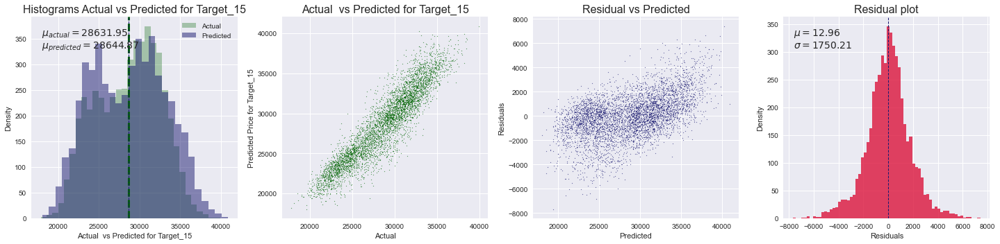

In [36]:
load_prediction_pca = load_xgb_end_test_1.predict(PC_test)
e_minus_o = get_and_plot_data(load_prediction_pca, load_target_test, start_index=10, stop_index=15)

In [37]:
print(get_ttest (load_prediction_pca, load_target_test, idx=10))

p-value: 0.5218680966364367
we are accepting null hypothesis


In [38]:
print(get_ztest (load_prediction_pca, load_target_test, idx=10))

p-value: 0.5218394886532252
accept null hypothesis


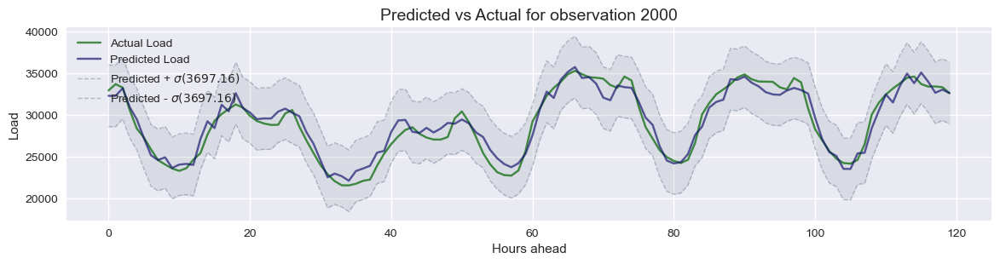

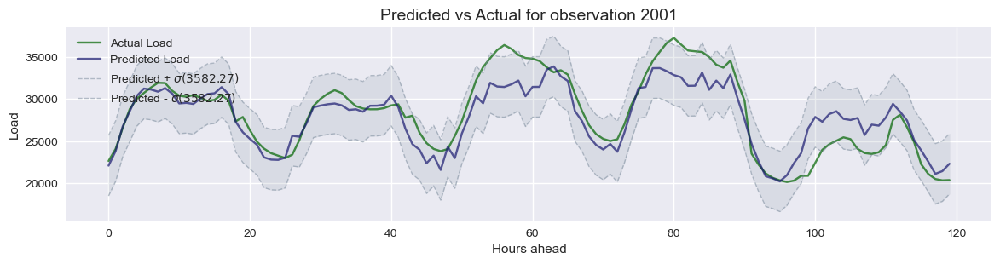

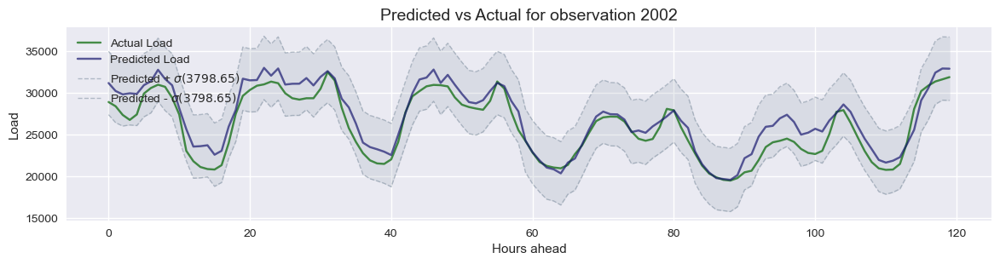

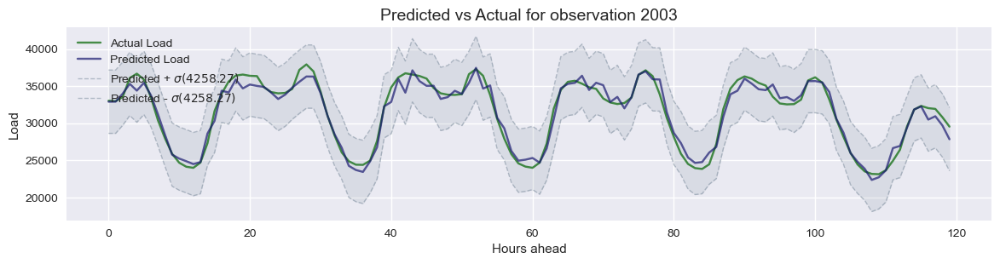

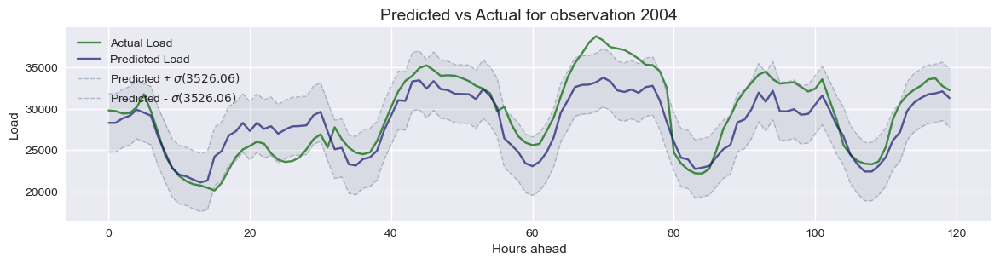

In [39]:
plot_actual_vs_prediction(load_prediction_pca, load_target_test, variable_name = 'Load', start_inx = 2000, end_inx = 2005)